# Investigations of Transmission Matix

We in particular want to see if using the eigenvectors of this matrix (M) will work for diagonalizing the system for finding the unknown coefficients in the integral expansion of the radiation field.  This requires having two vectors v1 and v2, and their mapped versions w1 = Mv1, w2 = Mv2, such that v1.T * v2 + w2.T * w2 = 0 and v1 x v2 - w1 x w2 =0.  The first equation diagonalizes the system, the second ensures that the integrals exist to form the system.  Also note that even if the vectors are complex, we do not take the conjugates of any vectors in equation 1, so it is not the complex inner product.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from scipy.linalg import eig
from fiberamp.fiber.microstruct.bragg import plotlogf, plotlogf_real
from scipy.optimize import newton
%matplotlib widget

In [2]:
A = SlabExact(ns=[1.4, 1.5, 1.4], Ts=[1, 1, 1], wl=.9e-6,
              symmetric=True) # Need symmetric interfaces for properties to hold.

# A = SlabExact(ns=[2, 1, 2], ts=[1e-6, 1e-6, 1e-6], symmetric=True) # Need symmetric interfaces for properties to hold.

# A = SlabExact(ns=[1, 2, 2.5, 1], ts = [1e-6, 2e-6, 2e-6, 1e-6], xrefs=[100, 100, 100, 100], scale=1e-6,
#              wl=1.8e-6)  

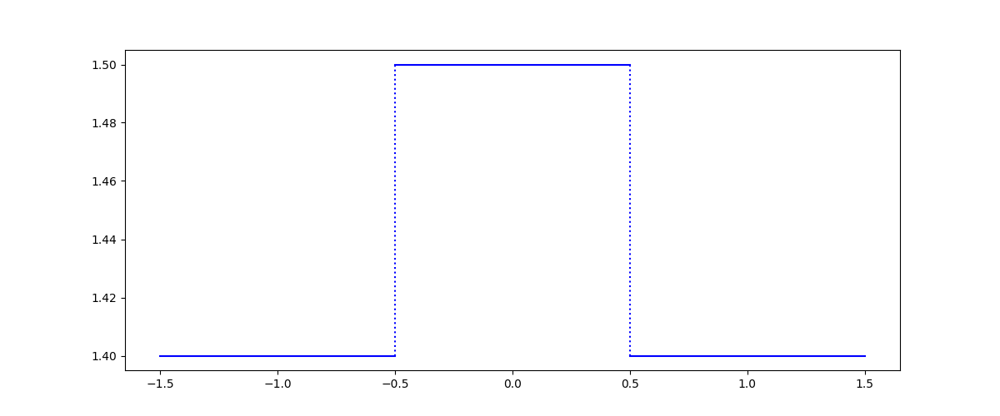

In [3]:
A.plot_refractive_index()

In [4]:
A.transmission_matrix_Z(1+1j) @ A.transmission_matrix_Z(1-1j).conj()

array([[ 1.00000000e+00+5.55111512e-17j, -7.95590627e-16-4.44089210e-16j],
       [-9.50460929e-17-5.55111512e-17j,  1.00000000e+00+3.88578059e-16j]])

### Set up matrices and coefficient vectors

In [5]:
A.Ks

array([ 9.77384381, 10.47197551,  9.77384381])

In [6]:
# Set betas, types of radiation modes (via sign), find vectors v and w for both, and transmission matrices

beta1 = .8 * A.K_low
beta2 = beta1   # mostly care about case when betas are equal
# beta2 = .75 * A.K_low

sign1 = '+1'   # class A modes are sign +1, class B are sign -1
sign2 = '-1'

C1 = A.coefficients(beta1, mode_type='radiation', sign=sign1, paper_method=False)
C2 = A.coefficients(beta2, mode_type='radiation', sign=sign2, paper_method=False)

v1, w1 = C1.T[0], C1.T[-1]
v2, w2 = C2.T[0], C2.T[-1]

M1 = A.transmission_matrix(beta1, Ztype_far_left='standard', Ztype_far_right='standard')
M2 = A.transmission_matrix(beta2, Ztype_far_left='standard', Ztype_far_right='standard')


In [7]:
M2 @ v2, w2 , M1 @ v1, w1  # check that trans mat applied to v gives w

(array([-0.19128798+0.3500912j, -0.19128798-0.3500912j]),
 array([-0.19128798+0.3500912j, -0.19128798-0.3500912j]),
 array([0.32726805+0.22814593j, 0.32726805-0.22814593j]),
 array([0.32726805+0.22814593j, 0.32726805-0.22814593j]))

In [8]:
np.round(M2.conj() @ M2, 10)   # Check symmetric geom property M.conj @ M = I

array([[ 1.+0.j, -0.+0.j],
       [-0.-0.j,  1.-0.j]])

Check conditions

In [9]:
J = np.array([[0, 1],[-1, 0]])  # rotation matrix for real cross products
I = np.eye(2)

S = 2*np.array([[0,1],[1,0]])      # Matrices for conditions for complex model
JJ = np.array([[0,2j],[-2j, 0]])


In [10]:
v2.T @ (S + M2.T @ S @ M1) @ v1

(-1.5232259897857148e-12+0j)

In [11]:
v2.T @ (JJ - M2.T @ JJ @ M1) @ v1

(-4.215700877785879e-16+2.2731086401033858e-18j)

#### Paper method of finding b and v1, w1

In [15]:
M1 = A.transmission_matrix_Z(1+1j)

r1 = -M1[..., 1, 0] / M1[..., 1, 1]

m1, m2 = M1[..., 0, 0], M1[..., 0, 1]
m3, m4 = M1[..., 1, 0], M1[..., 1, 1]

detM = (M1[..., 0, 0] * M1[..., 1, 1]
        - M1[..., 0, 1] * M1[..., 1, 0])

frac = (-M1[..., 1, 0] * detM) / \
    (M1[..., 0, 1])

sign= '1'

b = int(sign) * np.sqrt(frac, dtype=complex)

t2 = 1 / (detM * M1[..., 1, 1])

phase_term = 1 / np.sqrt(r1 + b * t2, dtype=complex)

C = np.sqrt(1/(2*np.pi)) * phase_term
V0 = np.array([C, C.conjugate()], dtype=complex)

W0 = np.array([(b*C).conjugate(), b*C], dtype=complex).T

V0, M1@V0, W0   


(array([0.11738849-0.24609737j, 0.11738849+0.24609737j]),
 array([0.09842935+0.74396161j, 0.17859247-0.12328042j]),
 array([0.11738849+0.24609737j, 0.11738849-0.24609737j]))

In [16]:
 M1@V0 / W0

array([2.61812033+0.84888288j, 0.69008536+0.39652759j])

### Notes

- Noticing that the vector V0 above doesn't behave like we want for complex Zs.  Not yet clear why.  But this is the reason why we don't get even and odd modes when going to complex plane: we use the V0 vector above and apply transfer matrices, but never checked that end coefficients in fact were switched in correct ways for even and odd.

#### Checking b for detM $\neq 1$

In [17]:
def det_even(b):
    return m1 * m4 - (m2 - b.conjugate()) * (m3 - b)

def det_odd(b):
    return m1 * m4 - (m2 + b.conjugate()) * (m3 + b)

def det(b):
    return det_even(b) * det_odd(b)

In [18]:
det(b), np.abs(b)

((-3.697785493223493e-32-1.4791141972893971e-31j), 1.0000000000000002)

In [19]:
ts = np.linspace(0, 2*np.pi, 100)
xs, ys = np.cos(ts), np.sin(ts)

In [20]:
Xs = np.linspace(-3,3, 1000)
Ys = (1/2*(1-detM) - Xs*m2.real)/m2.imag

In [21]:
Bp = m2/(2*np.abs(m2)**2)*(1-detM + 1j * np.sqrt(4*np.abs(m2)**2 - (1-detM)**2))
Bm = m2/(2*np.abs(m2)**2)*(1-detM - 1j * np.sqrt(4*np.abs(m2)**2 - (1-detM)**2))

(-6.0, 6.0, -6.0, 6.0)

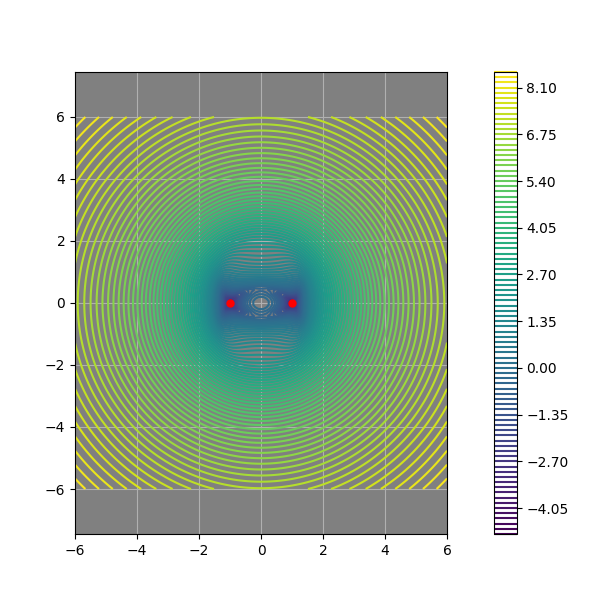

In [22]:
plotlogf(det, -6, 6, -6, 6, rref=100, iref=100, levels=100, figsize=(6,6), colorbar=True)
# plt.plot(m2.real, m2.imag, marker='o', markersize=5, color='r')

# plt.plot(xs, ys, color='g')
# plt.plot(Xs, Ys.real, color='g')

plt.plot(b.real, b.imag, marker='o', markersize=5, color='r')
plt.plot(-b.real, -b.imag, marker='o', markersize=5, color='r')

# plt.plot(Bm.real, Bm.imag, marker='o', markersize=3, color='b')
# plt.plot(Bp.real, Bp.imag, marker='o', markersize=3, color='b')

plt.axis('equal')

In [23]:
np.sqrt(-m3/m2)

(1-2.5505547479115166e-16j)

In [24]:
B = np.array([[0, b.conj()],[b, 0]])
np.linalg.det(M1-B)

(3.2550638242251187e-16+2.7424383354454803e-16j)

### Other version of forming classes

In [25]:
VVe = np.array([b.conj() - m2, m1]) * (m1.conj() + b - m2.conj())
VVo = np.array([-(b.conj() + m2), m1]) * (m1.conj() - b - m2.conj())

(M1-B) @ VVe, (M1+B) @ VVo

(array([0.0000000e+00+1.77635684e-15j, 8.8817842e-16-4.44089210e-16j]),
 array([3.55271368e-15-3.55271368e-15j, 8.88178420e-16+7.77156117e-16j]))

In [26]:
M1 @ VVe, VVe

(array([ 8.30187282+4.26858546j, -0.89072522-4.26858546j]),
 array([-0.89072522-4.26858546j,  8.30187282+4.26858546j]))

In [27]:
(M1-B) @ v1, (M1+B) @ v2

(array([-1.01527133+0.59552631j, -0.16665599+0.27806583j]),
 array([-1.22683778-1.18868324j, -0.07089652+0.79479415j]))

In [28]:
VVe /v1,  M1 @ VVe / w1

(array([ 4.28735966-10.05427136j, 23.1899687  -3.12316295j]),
 array([23.1899687  -3.12316295j,  4.28735966-10.05427136j]))

In [29]:
VVe[0]*VVo[1].conj()

(-19.636301032932955-60.936010864043446j)

### Notes

- Doesn't seem like paper's method gives vectors that work when determinant M is not 1, i.e. when outer refractive indices are different.  The b they pick does make the determinant of both M-B and M+B zero, but vectors given by paper aren't in the null spaces of these.

- Paper vectors also don't work when M matrix comes from complex Z.  The above vectors work, but now we no longer get conjugate entries.  This seems like the better thing to have fail (over even and odd).  In fact, it must fail for complex Z, since mapping conjugate entries to each other enforces a certain form on M that it no longer has for complex Z.

- This is perhaps why we get weird plots for the determinant of the N matrix: our normalization is wrong.  I'm getting the first and last coefficient pairs from the fields, and these aren't actually correct, since M1 @ v for these vectors doesn't equal the correct thing (w, but with entries switched in correct way for even and odd) in the Z plane.  If I just use entries of first vector, that might be closer.

- But even that doesn't seem to be correct, since even the first vector is not in the null space of M+- B.

In [30]:
J = np.array([[0, 1],[-1, 0]])  # rotation matrix for real cross products
I = np.eye(2)

S = np.array([[0,1],[1,0]])      # Matrices for conditions for complex model
JJ = np.array([[0,2j],[-2j, 0]])


What's more, even for the two vectors in null of M-B and M+B respectively, they aren't orthogonal as we would want:

In [31]:
VVo.T @ (S + M2.T @ S @ M1) @ VVe

(-4.440892098500626e-16+4.440892098500626e-16j)

Furthermore, they also don't satisfy the existence condition:

In [32]:
VVo.T @ (JJ - M2.T @ JJ @ M1) @ VVe

(-4.2674463726097674e-15+2.3010098443809295e-17j)

Of course, we're not completely sure these are the conditions we need to satisfy, they just appear to be based on initial studies of sinc functions when outer indices differ.

In [33]:
C = 1j*1

VVe2 = np.array([C, C.conjugate()], dtype=complex)
VVo2 = 1j * J @ (S + M1.transpose() @ S @ M1) @ VVe2


In [34]:
VVo2.T @ (S + M1.T @ S @ M1) @ VVe2

(-5.551115123125783e-17+0j)

In [35]:
VVo2.T @ (JJ - M1.T @ JJ @ M1) @ VVe2

(-4.868756375617525e-15-1.5614853237802657e-18j)

Once again, if we want to really satisfy both of these we need the generalize eigenvalue problem

### Convert to real (sine/cosine) model

Note: need to use converted vectors with this

In [36]:
# transform to create real version of M
T = np.array([[1, -1j],[1, 1j]])*.5   
Tinv = np.array([[1, 1], [1j, -1j]])

L = np.array([[-1, 0],[0, 1]])  # inverse builder for real transmission matrices on symmetric geometries

M1r = (Tinv @ M1 @ T).real
M2r = (Tinv @ M2 @ T).real

# Real vectors
v1r, v2r = (Tinv @ v1).real, (Tinv @ v2).real
w1r, w2r = (Tinv @ w1).real, (Tinv @ w2).real

In [37]:
M2r @ v2r, w2r

(array([-0.38257596, -0.70018241]), array([-0.38257596, -0.70018241]))

In [38]:
np.round(L @ M2r @ L @ M2r, 10)   # Check symmetric geom property LML @ M = I

array([[ 1., -0.],
       [-0.,  1.]])

### Convert to model from paper, which subtracts rho_i from x in exponential 

Note: we can't use the vectors v,w above with these

In [39]:
Z01 = np.sqrt(A.K0**2 * A.ns[0]**2 - beta1**2, dtype=complex)
Z02 = np.sqrt(A.K0**2 * A.ns[0]**2 - beta2**2, dtype=complex)
Zd1 = np.sqrt(A.K0**2 * A.ns[-1]**2 - beta1**2, dtype=complex)
Zd2 = np.sqrt(A.K0**2 * A.ns[-1]**2 - beta2**2, dtype=complex)

E1_1 = np.array([[np.exp(1j * Z01 * A.rhos[1]), 0 ],[0, np.exp(-1j * Z01 * A.rhos[1])]])
E1_2 = np.array([[np.exp(1j * Z02 * A.rhos[1]), 0 ],[0, np.exp(-1j * Z02 * A.rhos[1])]])

Ed_1 = np.array([[np.exp(1j * Zd1 * A.rhos[-2]), 0 ],[0, np.exp(-1j * Zd1 * A.rhos[-2])]])
Ed_2 = np.array([[np.exp(1j * Zd2 * A.rhos[-2]), 0 ],[0, np.exp(-1j * Zd2 * A.rhos[-2])]])

M1_theirs = Ed_1.conj() @ M1 @ E1_1
M2_theirs = Ed_2.conj() @ M2 @ E1_2

In [40]:
np.round(M2_theirs.conj() @ M2_theirs, 10)  # Has same inverse property as unshifted complex model

array([[ 1.+0.j, -0.+0.j],
       [-0.-0.j,  1.-0.j]])

## Checking Conditions


In [41]:
J = np.array([[0, 1],[-1, 0]])  # rotation matrix for real cross products
I = np.eye(2)

S = np.array([[0,1],[1,0]])      # Matrices for conditions for complex model
JJ = np.array([[0,2j],[-2j, 0]])


#### Complex model


For complex transmission matrices (M1 and M2) the conditions are 

v2.T @( S + M2.T @ S @ M1) v1 = 0

and

v2.T @( JJ - M2.T @ JJ @ M1) v1 = 0


In [42]:
v2.T @ (S + M2.T @ S @ M1) @ v1,  v2.T @ (JJ - M2.T @ JJ @ M1) @ v1

((-7.616129948928574e-13+0j), (-4.215700877785879e-16+2.2731086401033858e-18j))

### Real model


For real transmission matrices (M1r and M2r) the conditions are 

v2.T @( I + M2.T @ M1) v1 = 0

and

v2.T @( J - M2.T @ J @ M1) v1 = 0


In [43]:
v2r.T @ (I + M2r.T @ M1r) @ v1r,  v2r.T @ (J - M2r.T @ J @ M1r) @ v1r

(-1.5233370120881773e-12, 3.5130840648215656e-16)

#### Complex Model with shifts
Can't use paper model yet here because coefficient vectors are different

### Is Matrix (JJ - M2.T @ JJ @ M1) =0?

Complex model:

In [44]:
np.round((JJ - M2.T @ JJ @ M1), 10)

array([[ 0.+0.j,  0.+0.j],
       [-0.-0.j,  0.+0.j]])

Complex model with shifts (paper model):

In [45]:
np.round((JJ - M2_theirs.T @ JJ @ M1_theirs), 10)

array([[ 0.-0.j,  0.+0.j],
       [-0.-0.j, -0.-0.j]])

Real model (uses just J (-90 deg rotation) matrix):

In [46]:
2*np.round((J - M2r.T @ J @ M1r), 10)

array([[ 0.,  0.],
       [-0.,  0.]])

### Observations

- If outer regions have same refractive index, these matrices are all zero in all cases, (even without symmetric flag in otherwise symmetric geometries).

- If outer regions have different refractive indices, none of these matrices are zero.

- Okay, we actually proved that det M * J =  (M.T @ J @ M) for all 2x2 matrices. So this all makes sense.

## If outer regions have same index, what is choice that gives result from paper

Don't know if the generalized eigenproblem thing will work, so let's look at this.  We've seen that the second condition gives no restriction in this case, so we are free to choose v1 and make v2 = ((I + M.T M)v1).perp.  What choice of v1 gives even/odd classes in case of symmetric geometry?

Found this on paper.  Way to do it is (up to scaling) to pick v1 = [B, 1-A], v2=[-B, 1+A], where real transmission matrix is [[A, B], [C, A]].  Here v1 gives even modes and v2 gives odd modes.  Below we see that these are in fact multiples of the associated even and odd vectors from the paper:

In [47]:
v1r_ours = np.array([M1r[0, 1], 1 - M1r[0, 0]])  # even real vector
v2r_ours = np.array([-M1r[0, 1], 1 + M1r[0, 0]])  # odd real vector

v1r_ours/v1r, v2r_ours/v2r  # our vectors are multiples of theirs

(array([1.20903637, 1.20903637]), array([-2.06849891, -2.06849891]))

Below we do the complex version, it still works

In [48]:
ev = 1j*(M1[0, 0].conj() + M1[0,1] - 1)
odd = 1j*(M1[0, 0].conj() + M1[0,1] + 1)

v1_ours = np.array([ev, ev.conj()])  # even complex vector
v2_ours = np.array([odd, odd.conj()])  # odd complex vector

v1_ours/v1, v2_ours/v2  # our vectors are multiples of theirs

(array([2.41807274+2.67286131e-12j, 2.41807274-2.67286131e-12j]),
 array([4.13699782-3.45807614e-13j, 4.13699782+3.45807614e-13j]))

There is an even more basic way to pick the entries, but they aren't conjugate at first.  However, both entries have same norm (for symmetric structures) so they can be made cojugate.

In [49]:
v1_other =  np.array([1 - M1[0, 1].conj(), M1[0, 0]])
v2_other =  np.array([-1 - M1[0, 1].conj(), M1[0, 0]])

np.abs(v1_other), np.abs(v2_other)

(array([1.00593939, 1.00593939]), array([1.00593939, 1.00593939]))

Normalization for these modes involves the following expression

In [50]:
def normalization(Z, type='even'):
    if type=='even':
        s = -1
    elif type=='odd':
        s = 1
    else:
        raise ValueError('Type must be even or odd')
    M = A.transmission_matrix(Z, Z_plane=True)
    return np.abs(M[...,0,0].conj() + M[...,0,1] + s)

In [51]:
normalization(1)

2.804202748796628

In [52]:
zs = np.linspace(0.0001, 200, 10000)
yse = normalization(zs)
yso = normalization(zs, 'odd')

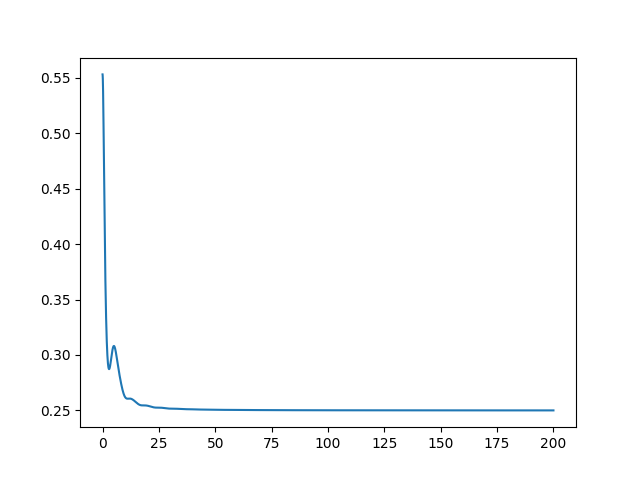

In [53]:
# plt.plot(zs, 1/(2*yse))
plt.close('all')
plt.plot(zs, 1/(2*yso))

What is paper's version of this?

In [54]:
def normalization_papers(Z, sign='-1'):
    C = A.coefficients(Z, mode_type='radiation', sign=sign, Z_plane=True)
    return np.abs(C.transpose(0,2,1)[..., 0,0])

In [55]:
 np.sqrt(2/np.pi)/2, normalization_papers(zs)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

# Plot resulting expressions

We have some expressions now for the even and odd vectors.  We can plot the associated expressions that appear in front of the delta function in the expansion.

Below we plot the M[0, 0] entry, and the expressions (N_A from dissertation) from their even vectors and our even vectors:

In [56]:
def M00(beta):
    M = A.transmission_matrix(beta, Ztype_far_left='standard', Ztype_far_right='standard')
    return M[..., 0, 0]

In [74]:
def coeffs_theirs(beta, Z_plane=False):
    C = A.coefficients(beta, mode_type='radiation', sign='1', Z_plane=Z_plane)
    v, w = C.T[0], C.T[-1]
    return 1/(np.linalg.norm(v)**2 + np.linalg.norm(w)**2)

In [61]:
def coeffs_ours(beta):
    M = A.transmission_matrix(beta, Ztype_far_left='standard', Ztype_far_right='standard')
    Mr = (Tinv @ M @ T)
    return Mr[..., 0, 1]**2 +(1 - Mr[..., 0,0])**2 

def general_coeffs(beta, v=np.array([1,1]), Z_plane=False):
    M = A.transmission_matrix(beta, Ztype_far_left='standard', Ztype_far_right='standard', Z_plane=Z_plane)
    w = M @ v
    inds = np.arange(len(M.shape))
    inds[-1], inds[-2] = inds[-2], inds[-1]
    Q = S + M.transpose(inds) @ S @ M
    return v.T @ Q @ v


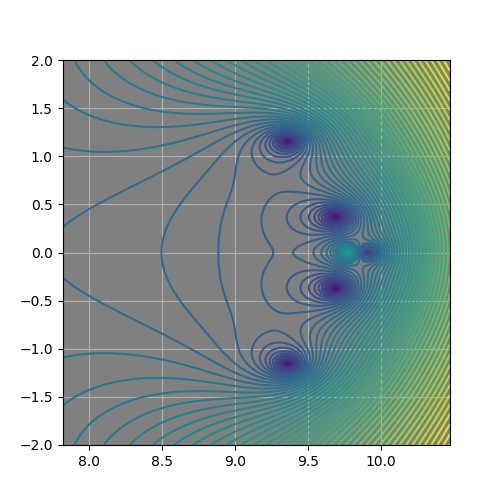

In [66]:
plotlogf(general_coeffs, .8*A.K_low, A.K_high, -2, 2,  rref=100, iref=100, levels=80, figsize=(5,5), colorbar=False)

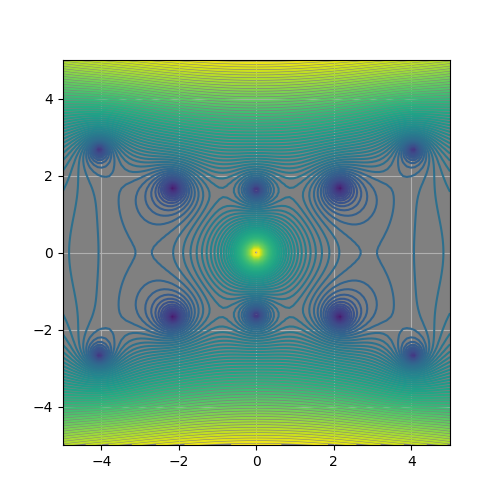

In [68]:
plotlogf(general_coeffs, -5,5, -5, 5, np.array([1,1]), True,
         rref=100, iref=100, levels=80, figsize=(5,5), colorbar=False)

In [69]:
newton(general_coeffs, np.array([9.4-1.3j]), args=(np.array([3j,-3j]),)), newton(M00, np.array([9.4-1.3j]))


(array([9.37515791-1.25791109j]), array([9.31321827-1.19762371j]))

In [70]:
newton(general_coeffs, np.array([9.4-1.3j]), args=(np.array([3j,-3j]),)), newton(general_coeffs, np.array([9.4-1.3j]), args=(np.array([3,3]),))

(array([9.37515791-1.25791109j]), array([9.36279981-1.159362j]))

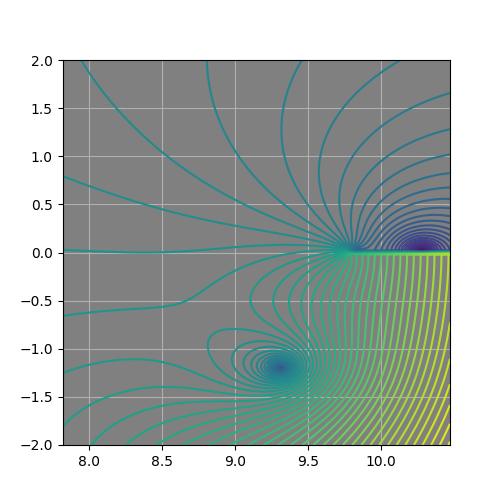

In [71]:
plotlogf(M00, .8*A.K_low, A.K_high, -2, 2, rref=100, iref=100, levels=80, figsize=(5,5), colorbar=False)

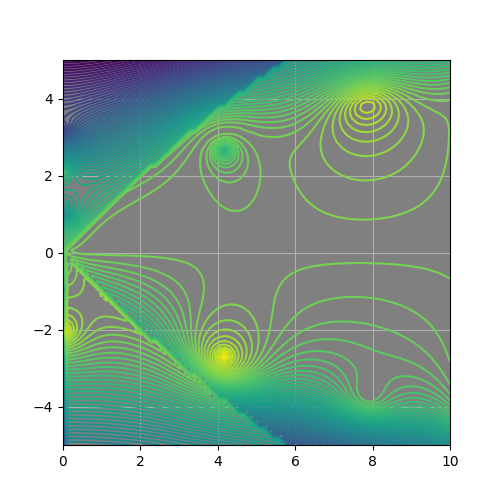

In [81]:
plotlogf(coeffs_theirs, 0, 10,-5,5, True, 
         rref=80, iref=80, levels=80, loop=True, figsize=(5,5), colorbar=False)

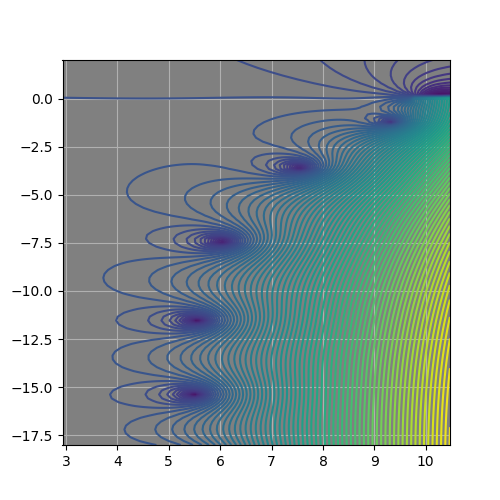

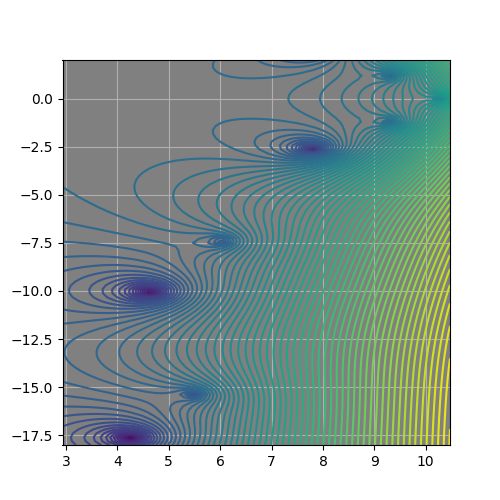

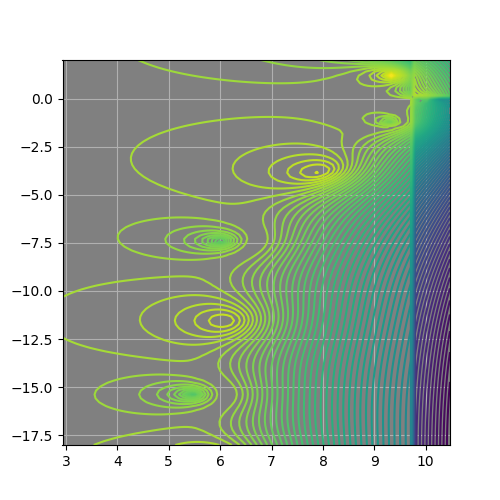

In [72]:
plotlogf(M00, .3*A.K_low, A.K_high, -18, 2, rref=100, iref=100, levels=80, figsize=(5,5), colorbar=False)
plotlogf(coeffs_ours, .3*A.K_low, A.K_high, -18, 2, rref=100, iref=100, levels=80, figsize=(5,5), colorbar=False)
plotlogf(coeffs_theirs, .3*A.K_low, A.K_high, -18, 2, rref=100, iref=100, levels=80, loop=True, figsize=(5,5), colorbar=False)

Possible the eigenequation is in there. The zeros in M[1,1] are close to zeros in the other functions.  Need to zoom in/ mode find

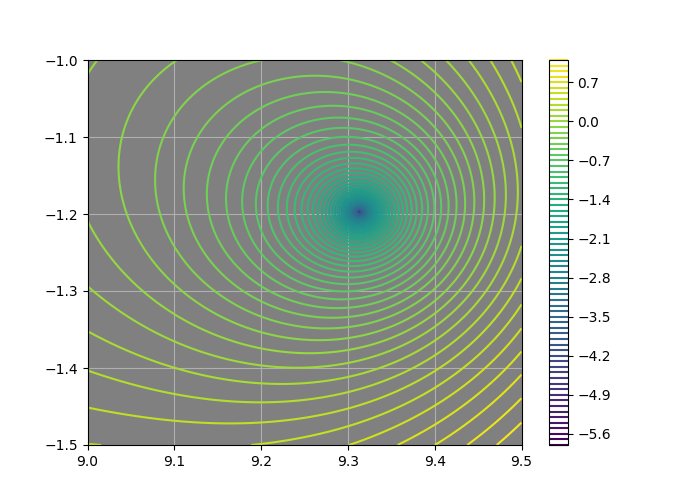

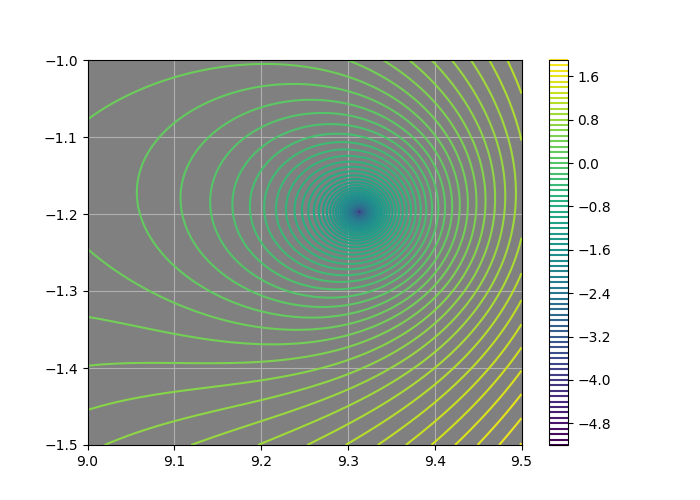

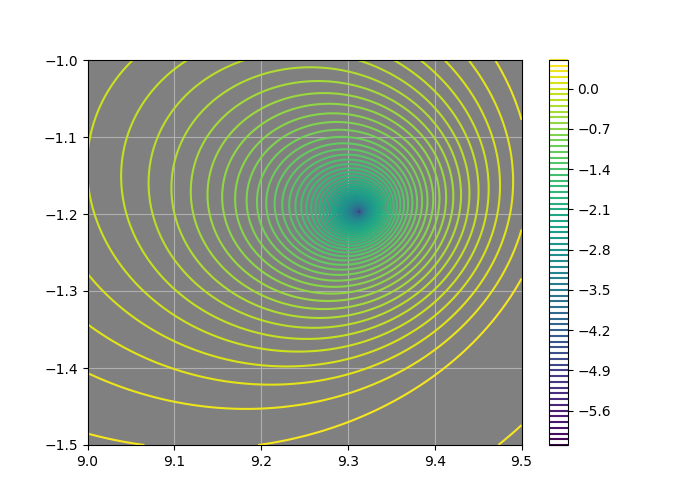

In [128]:
plotlogf(M00, 9, 9.5, -1, -1.5, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_ours, 9, 9.5, -1, -1.5, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_theirs, 9, 9.5, -1, -1.5, rref=100, iref=100, levels=80, loop=True, figsize=(7,5))

In [129]:
true_zero = newton(M00, np.array([9.3-1.2j]))
our_zero = newton(coeffs_ours, np.array([9.3-1.2j]))
their_zero = newton(coeffs_theirs, np.array([9.31321827-1.19762371j]))  # their zero is extremely sensitive to starting guess, only will find it if given exact zero from others

true_zero, our_zero, their_zero

(array([9.31321827-1.19762371j]),
 array([9.31321827-1.19762371j]),
 array([9.31321827-1.19762371j]))

### Observations

- If eigenequation is in there, it's not for the obvious zeros of the first example.  I did notice in test case that only one of the roots was the same, maybe that's the case here, zoom in near K_low now

- Moving to lower V number (1.4 clad, 1.5 core) and different wavelength (.9e-6) to find leaky modes, I did notice that there is a common zero.  Checked only the one with smallest imaginary part (in magnitude).  Also noticed that the zero is a pole in the paper's expression.


### Other shared zeros?

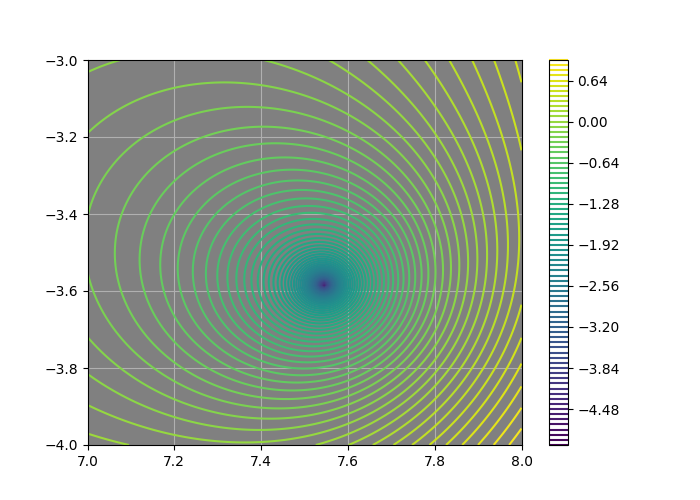

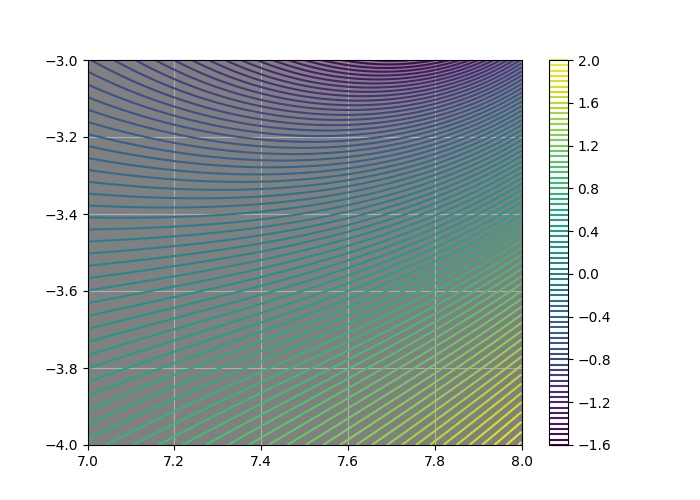

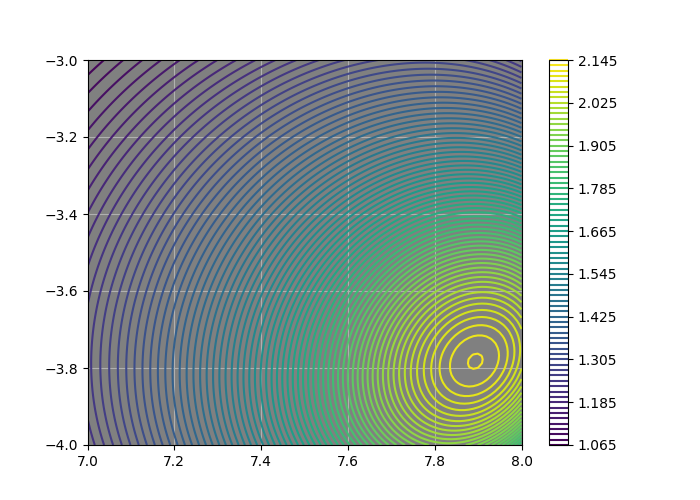

In [130]:
plotlogf(M00, 7, 8, -3, -4, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_ours, 7, 8, -3, -4, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_theirs, 7, 8, -3, -4,  rref=100, iref=100, levels=80, loop=True, figsize=(7,5))

No, they don't share them.  Well though, this is for the even modes, so maybe it shares every other one...


### Next zero down...

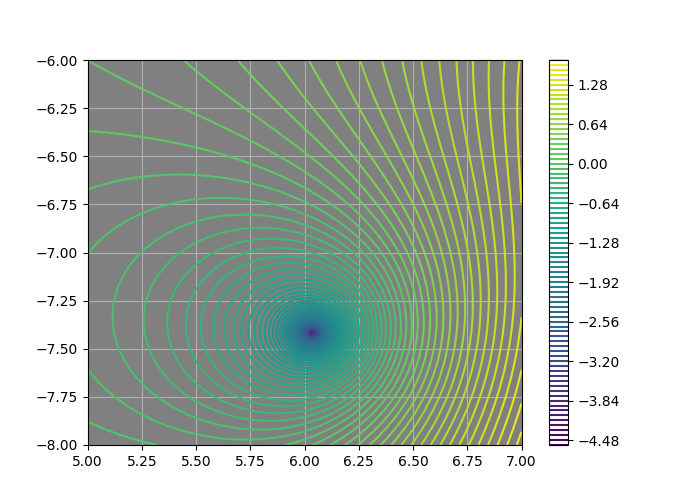

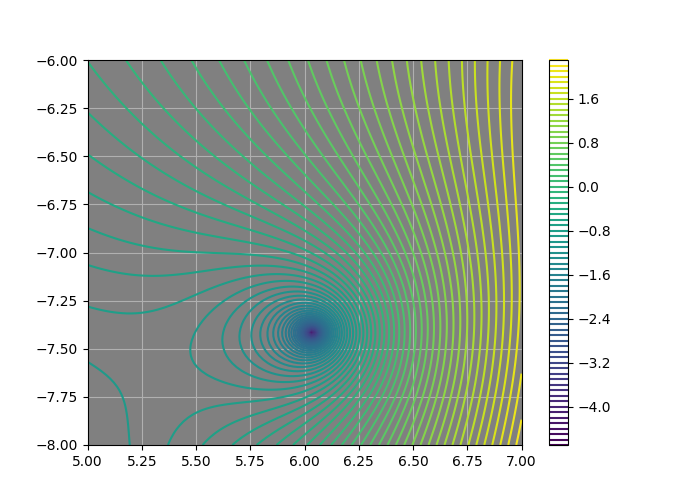

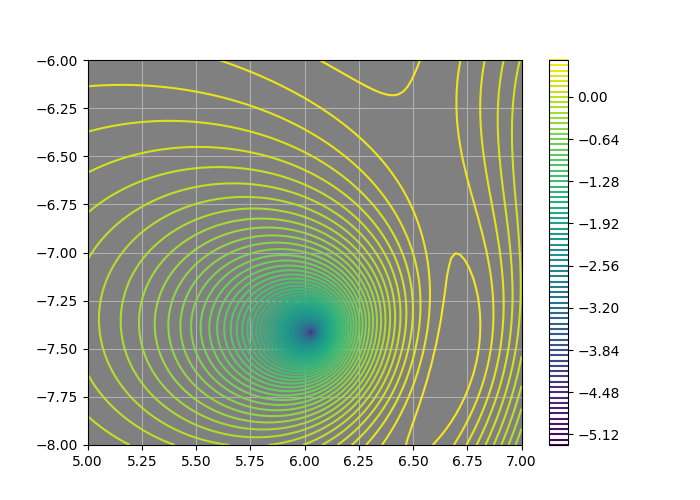

In [131]:
plotlogf(M00, 5, 7, -6, -8, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_ours, 5, 7, -6, -8, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_theirs, 5, 7, -6, -8,  rref=100, iref=100, levels=80, loop=True, figsize=(7,5))

#### Okay they might share this one:

In [132]:
true_zero = newton(M00, np.array([6 - 7.4j]))
our_zero = newton(coeffs_ours, np.array([6 - 7.4j]))
their_zero = newton(coeffs_theirs, np.array([6.03604552-7.41636252j]))  # their zero is extremely sensitive to starting guess, only will find it if given exact zero from others

true_zero, our_zero, their_zero

(array([6.03604552-7.41636252j]),
 array([6.03604552-7.41636252j]),
 array([6.03604552-7.41636252j]))

### So it does look like they share every other zero

Makes sense and our version and paper's version are only for even modes, but M00 has both even and odd roots.

### Another two down...

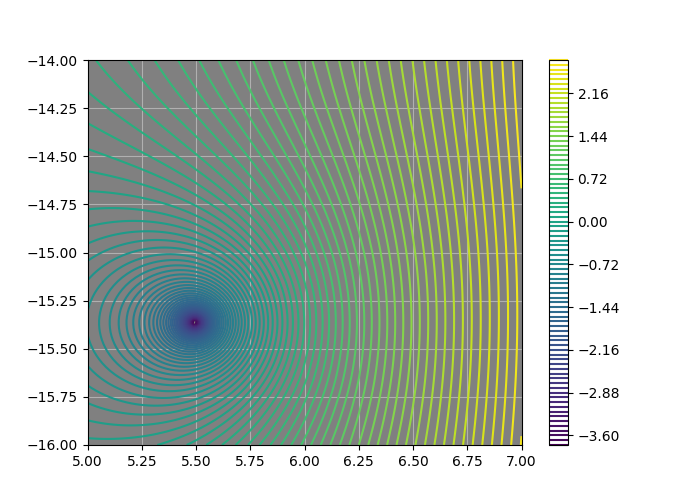

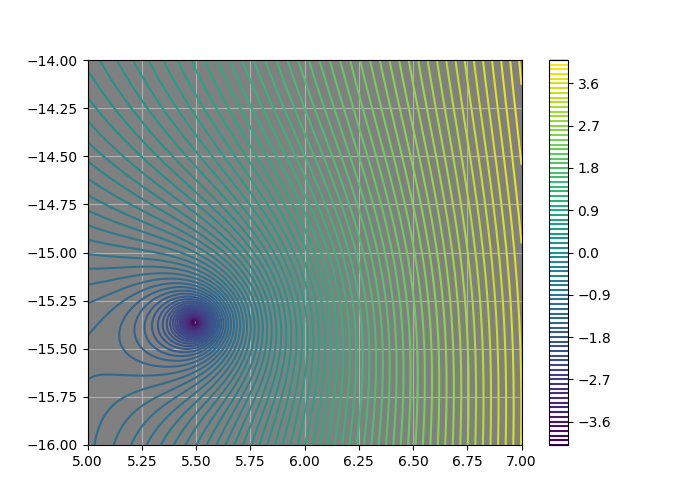

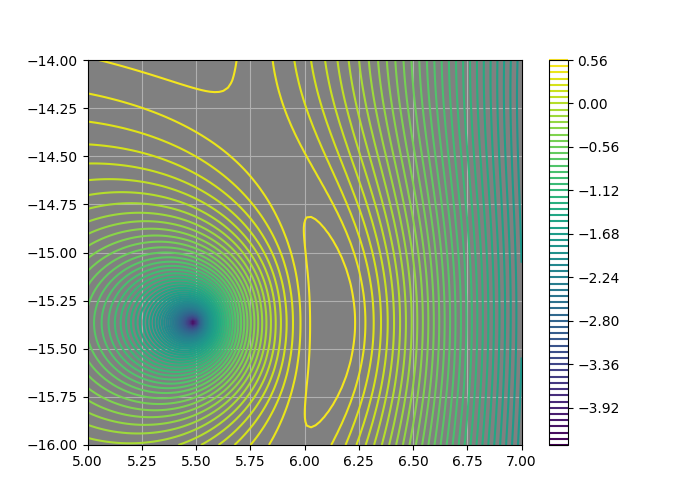

In [133]:
plotlogf(M00, 5, 7, -14, -16, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_ours,  5, 7, -14, -16, rref=100, iref=100, levels=80, figsize=(7,5))
plotlogf(coeffs_theirs,  5, 7, -14, -16,  rref=100, iref=100, levels=80, loop=True, figsize=(7,5))

#### Okay they might share this one:

In [134]:
true_zero = newton(M00, np.array([5.5 - 15.3j]))
our_zero = newton(coeffs_ours, np.array([5.5 - 15.3j]))
their_zero = newton(coeffs_theirs, np.array([5.49405307-15.36343784j]))  # their zero is extremely sensitive to starting guess, only will find it if given exact zero from others

true_zero, our_zero, their_zero

(array([5.49405307-15.36343784j]),
 array([5.49405307-15.36343784j]),
 array([5.49405306-15.36343783j]))

## Plot determinant of condition matrix

From derivations on paper, the product of the two expressions N_A and N_B contains a determinant term.  Can it be zero?

In [135]:
s = [1,2,3,4]
g = np.arange(len(s))
g

array([0, 1, 2, 3])

In [136]:
s[-2], s[-1] = s[-1], s[-2]
s

[1, 2, 4, 3]

In [137]:
list(s[-2:]).reverse()

In [138]:
def S_MTSM_det(beta):
    M = A.transmission_matrix(beta, Ztype_far_left='standard', Ztype_far_right='standard')
    s = np.arange(len(M.shape))
    s[-2], s[-1] = s[-1], s[-2]
    MTSM = M.transpose(s) @ (S @ M)
    return MTSM[...,0,0] * MTSM[...,1, 1] - (MTSM[...,0,1] + 1) * (MTSM[...,1,0] + 1)
    

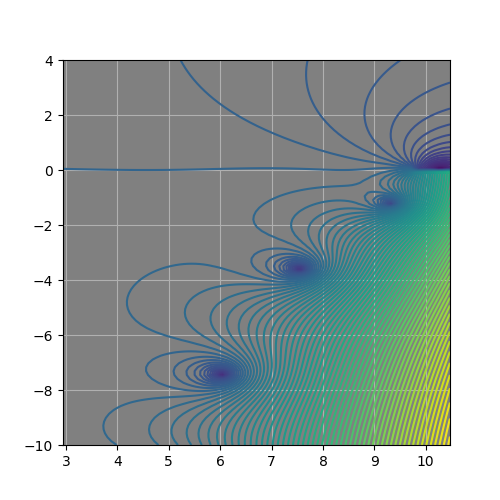

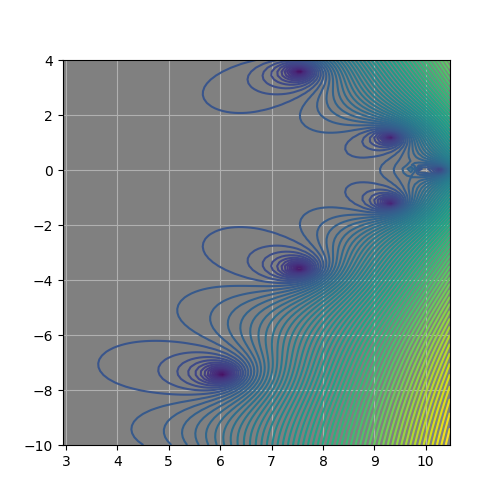

In [139]:
plotlogf(M00, .3*A.K_low, A.K_high, -10, 4, rref=100, iref=100, levels=80, figsize=(5,5), colorbar=False)
plotlogf(S_MTSM_det, .3*A.K_low, A.K_high, -10, 4, rref=100, iref=100, levels=80, figsize=(5,5), colorbar=False)


### Dude, how is that possible?  Seems like determinant should be everywhere non-zero

Looks like the determinant of the condition matrix has zeros of both M00 and maybe M11 too?

### Real part and guided modes

/home/pv/local/fiberamp/fiber/microstruct/bragg/utilities.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)


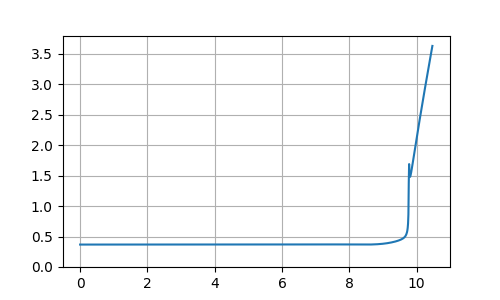

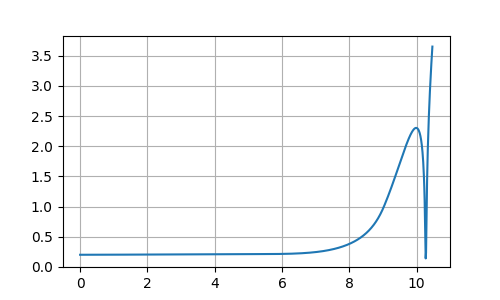

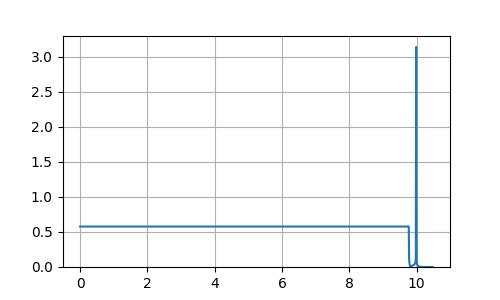

In [140]:
plotlogf_real(M00, 0, A.K_high, figsize=(5,3))
plotlogf_real(coeffs_ours, 0, A.K_high, figsize=(5,3))
plotlogf_real(coeffs_theirs, 0, A.K_high, loop=True, figsize=(5,3))

/home/pv/local/slab/slab.py:231: RuntimeWarning: divide by zero encountered in divide
  Y = 1 / Z_right
/home/pv/local/slab/slab.py:231: RuntimeWarning: invalid value encountered in divide
  Y = 1 / Z_right
/home/pv/local/slab/slab.py:241: RuntimeWarning: invalid value encountered in multiply
  Ymat = 1 / 2 * Ymat
/home/pv/local/slab/slab.py:400: RuntimeWarning: invalid value encountered in divide
  r1 = -M[..., 1, 0] / M[..., 1, 1]


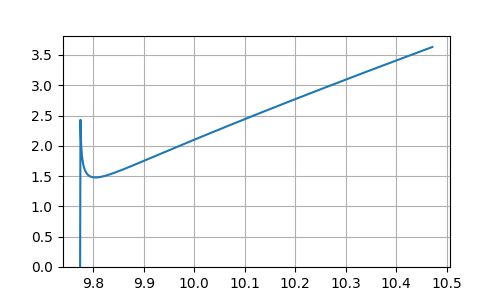

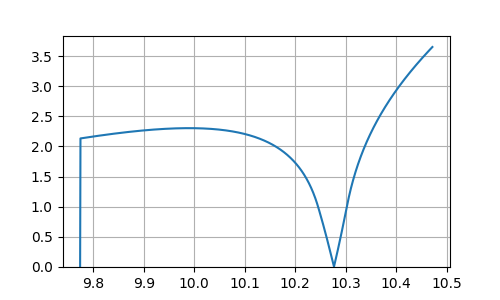

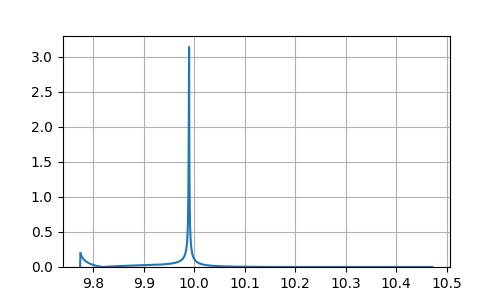

In [141]:
plotlogf_real(M00, A.K_low, A.K_high, figsize=(5,3))
plotlogf_real(coeffs_ours, A.K_low, A.K_high, figsize=(5,3))
plotlogf_real(coeffs_theirs, A.K_low, A.K_high, loop=True, figsize=(5,3))

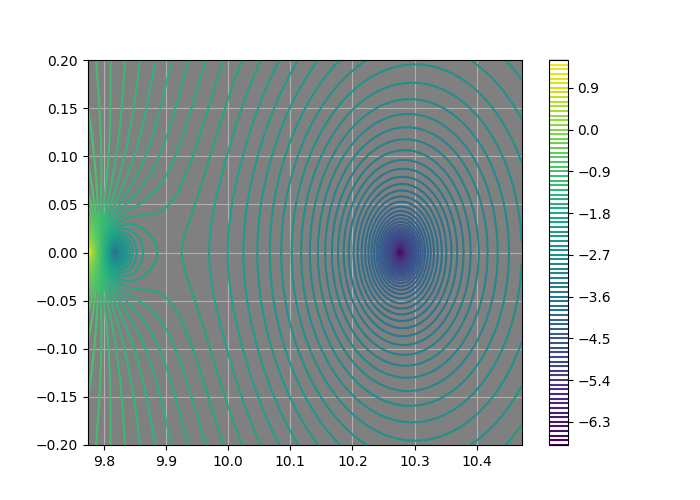

In [142]:
plotlogf(A.determinant, A.K_low, A.K_high, -.2, .2, 'TE', 'guided', figsize=(7,5), iref=100, rref=100,levels=100)

In [143]:
real_beta = newton(A.determinant, 10.28, args=('TE', 'guided')).real


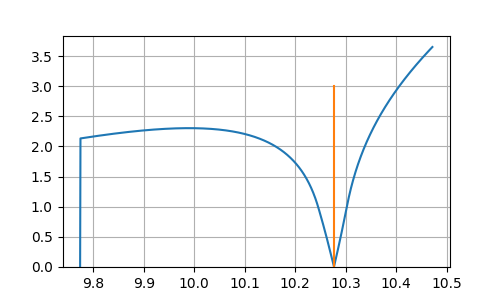

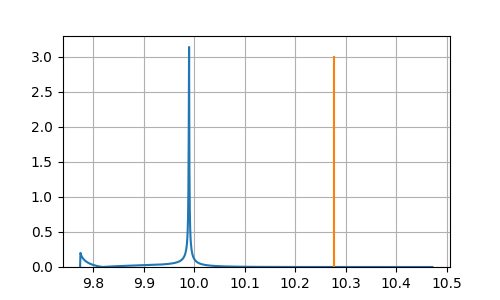

In [144]:
plotlogf_real(coeffs_ours, A.K_low, A.K_high, figsize=(5,3))
ax = plt.gca()
ax.plot([real_beta, real_beta],[0,3]);
plotlogf_real(coeffs_theirs, A.K_low, A.K_high, loop=True, figsize=(5,3))
ax = plt.gca()
ax.plot([real_beta, real_beta],[0,3]);

### Observations on 1d

- Appears both our expression has a zero at the guided mode, the paper's expression has a pole there.

## Generalized eigenproblem

Because we are working in R2 (or C2), if two vectors (Av1, Bv1) are perpendicular to a fixed third vector (and none are zero), then the first two vectors must be colinear.  Since we have this exact situation above (with A = cond1 matrix, B = cond2 matrix) <ins>when the outer refractive indices are not equal</ins>, we should see that the calculations below give a single complex scalar in each case ( if the vector we have given it is correct):

In [145]:
((S + M2.T @ S @ M1) @ v1 ) / ((JJ - M2.T @ JJ @ M1)  @ v1)  # Complex model (almost, they're conjugate)

array([-1.55115679e+14-1.49896662e+15j, -1.72661817e+14+1.50334363e+15j])

In [146]:
((I + M2r.T @ M1r) @ v1r ) / ((J - M2r.T @ J @ M1r)  @ v1r)  # Real model

array([ 5.56147584e+15, -2.11838868e+15])

Naturally, it shouldn't work, because for different outer refractive indices we didn't have it working. 

#### Formulation

Letting 

A = S + M2.T @ S @ M1
B = JJ - M2.T @ JJ @ M1

We can formulate the conditions above as we need a vector v1 satisfying

A v1 = lambda B v1

If we have this, then picking v2 = v1.perp will satisfy both conditions.  

In [147]:
BinvA = 2*np.linalg.inv(JJ - M2.T @ JJ @ M1) @ (S + M2.T @ S @ M1)
np.round(BinvA, 10)

array([[-8.79709708e+11+3.03629461e+15j, -1.46918769e+14+2.76910211e+14j],
       [-1.46918769e+14-3.13292387e+14j,  8.79709708e+11-3.03982858e+15j]])

In [148]:
lambdas, vecs = eig(BinvA)
V1, V2 = vecs[:,0], vecs[:,1]
V1, V2, lambdas

(array([ 0.99837278+0.j       , -0.05162577+0.0242191j]),
 array([-0.04565048-0.02421204j,  0.99866401+0.j        ]),
 array([0.        +3.01841157e+15j, 0.05566406-3.02194554e+15j]))

In [149]:
np.abs(V1), np.abs(V2)

(array([0.99837278, 0.05702442]), array([0.05167387, 0.99866401]))

### Have trouble here, eigenvectors are not of right form

They are not conjugate, and doesn't appear to be a way to convert them to being conjugate via scaling.

In [150]:
BinvAr = np.linalg.inv(J - M2r.T @ J @ M1r) @ (I + M2r.T @  M1r)
np.round(BinvAr, 10)

array([[ 1.76308843e+14, -3.29167037e+15],
       [ 3.99993888e+15, -1.76308843e+14]])

In [151]:
lambdasr, vecsr = eig(BinvAr)
V1r, V2r = vecsr[:,0], vecsr[:,1]
V1r, V2r, lambdasr

(array([0.03264643+0.67109377j, 0.74065334+0.j        ]),
 array([0.03264643-0.67109377j, 0.74065334-0.j        ]),
 array([0.+3.62427861e+15j, 0.-3.62427861e+15j]))

# Component sizes

In [32]:
def diff(Z):
    M = A.transmission_matrix_Z(Z)
    return np.abs(M[...,0,1]) - np.abs(M[...,1,0])

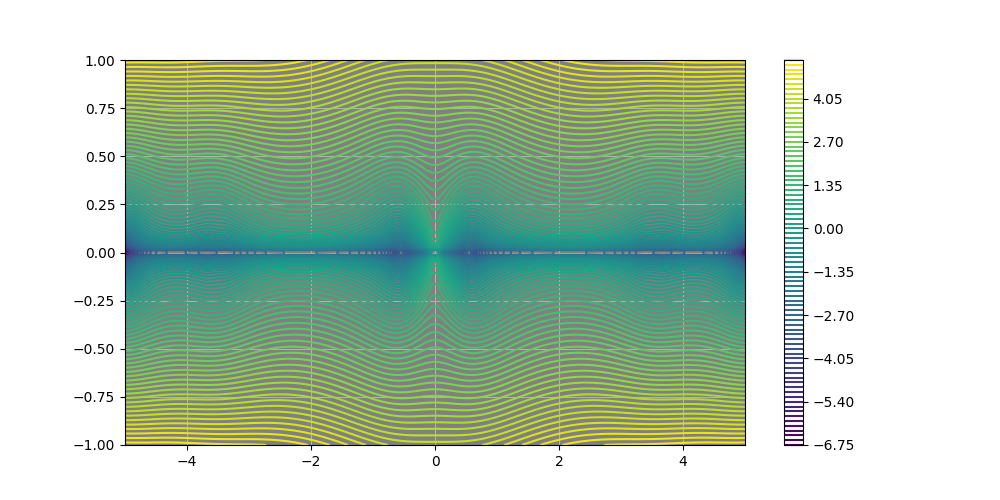

In [33]:
plotlogf(diff, -5,5,-1,1, rref=100, iref=100, levels=100,
        figsize=(10,5))